In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

In [2]:
pd.options.display.float_format = '{:.2f}'.format
%matplotlib inline

In [3]:
base = pd.read_csv('melb_data.csv')

Testando com apenas colunas chaves 

In [4]:
# TRATAMENTO DA BASE
base = base.drop(['Suburb', 'Address', 'SellerG', 'Date'], axis=1)
# retirar valore com mais de 20% de NaN
base = base.drop(['BuildingArea', 'YearBuilt'], axis=1)

In [5]:
base.head()

,Rooms,Type,Price,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,2,h,1480000.00,S,2.50,3067.00,2.00,1.00,1.00,202.00,Yarra,-37.80,145.00,Northern Metropolitan,4019.00
1,2,h,1035000.00,S,2.50,3067.00,2.00,1.00,0.00,156.00,Yarra,-37.81,144.99,Northern Metropolitan,4019.00
2,3,h,1465000.00,SP,2.50,3067.00,3.00,2.00,0.00,134.00,Yarra,-37.81,144.99,Northern Metropolitan,4019.00
3,3,h,850000.00,PI,2.50,3067.00,3.00,2.00,1.00,94.00,Yarra,-37.80,145.00,Northern Metropolitan,4019.00
4,4,h,1600000.00,VB,2.50,3067.00,3.00,1.00,2.00,120.00,Yarra,-37.81,144.99,Northern Metropolitan,4019.00


In [7]:
# PAGINA PARA VISUALIZAR OS DASH DOS DADOS
profile = ProfileReport(base)

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Filtrar apenas colunas numéricas
numeric_base = base.select_dtypes(include=[float, int])

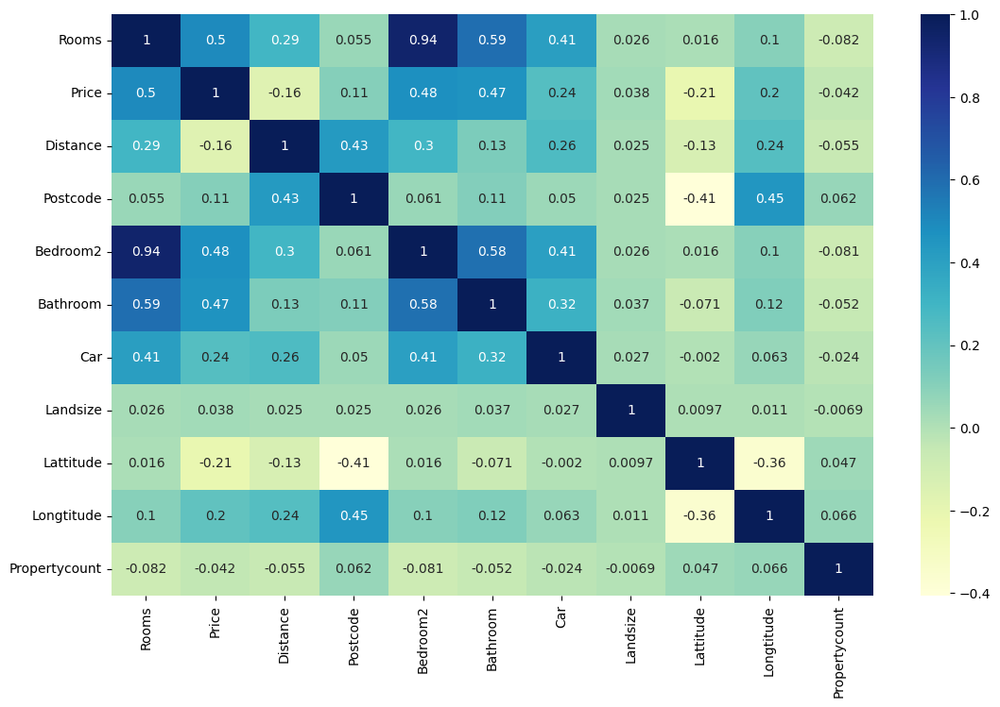

In [7]:
# Plotar o heatmap da correlação
plt.figure(figsize=(13, 8))
sns.heatmap(numeric_base.corr(), annot=True, cmap='YlGnBu')
plt.show()

Testando com mais colunas 

In [8]:
base1 = base[['Rooms',  'Bedroom2', 'Bathroom', 'Car', 'Landsize',  'Price']]
base1.info()
base1 = base1.dropna(axis=0)
base1.info()
base1.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Rooms     13580 non-null  int64  
 1   Bedroom2  13580 non-null  float64
 2   Bathroom  13580 non-null  float64
 3   Car       13518 non-null  float64
 4   Landsize  13580 non-null  float64
 5   Price     13580 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 636.7 KB
<class 'pandas.core.frame.DataFrame'>
Index: 13518 entries, 0 to 13579
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Rooms     13518 non-null  int64  
 1   Bedroom2  13518 non-null  float64
 2   Bathroom  13518 non-null  float64
 3   Car       13518 non-null  float64
 4   Landsize  13518 non-null  float64
 5   Price     13518 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 739.3 KB


,Rooms,Bedroom2,Bathroom,Car,Landsize,Price
0,2,2.00,1.00,1.00,202.00,1480000.00
1,2,2.00,1.00,0.00,156.00,1035000.00
2,3,3.00,2.00,0.00,134.00,1465000.00
3,3,3.00,2.00,1.00,94.00,850000.00
4,4,3.00,1.00,2.00,120.00,1600000.00


In [ ]:
# PAGINA PARA VISUALIZAR OS DASH DOS DADOS
profile = ProfileReport(base1)

Criando modelo de ML

Regressão Linear


In [16]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [11]:
Y = base1['Price']
X = base1.drop('Price', axis=1)

In [12]:
X_treino, X_teste, Y_treino, Y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

In [13]:
modelo = LinearRegression()
modelo.fit(X_treino, Y_treino)

LinearRegression()

In [14]:
y_regressao = modelo.predict(X_teste)

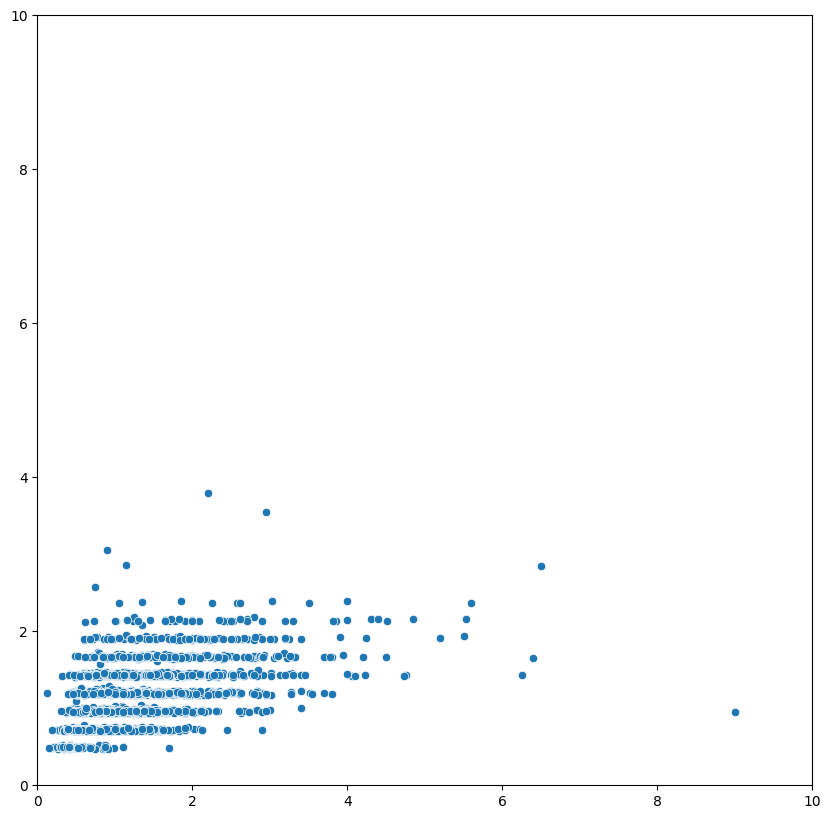

In [15]:
# Avaliando o modelo
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y_teste.values/1000000, y=y_regressao/1000000)
plt.ylim(0, 10)
plt.xlim(0, 10)
plt.show()

Calculando o erro

In [17]:
erro_quadratico_regressao = mean_squared_error(Y_teste, y_regressao)
print(erro_quadratico_regressao)

314570712917.19025


Modelo 2 

In [18]:
base2 = base[['Rooms', 'Distance', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'Lattitude', 'Longtitude', 'Propertycount', 'Price']]


In [19]:
# valores ausentes
base2 = base2.dropna(axis=0)
base2.head()

,Rooms,Distance,Bedroom2,Bathroom,Car,Landsize,Lattitude,Longtitude,Propertycount,Price
0,2,2.50,2.00,1.00,1.00,202.00,-37.80,145.00,4019.00,1480000.00
1,2,2.50,2.00,1.00,0.00,156.00,-37.81,144.99,4019.00,1035000.00
2,3,2.50,3.00,2.00,0.00,134.00,-37.81,144.99,4019.00,1465000.00
3,3,2.50,3.00,2.00,1.00,94.00,-37.80,145.00,4019.00,850000.00
4,4,2.50,3.00,1.00,2.00,120.00,-37.81,144.99,4019.00,1600000.00


In [20]:
Y = base2['Price']
X = base2.drop('Price', axis=1)

In [21]:
X_treino, X_teste, Y_treino, Y_teste = train_test_split(X, Y, test_size=0.3, random_state=42)

In [22]:
modelo2 = LinearRegression()
modelo2.fit(X_treino, Y_treino)

LinearRegression()

In [23]:
y_regressao2 = modelo2.predict(X_teste)

In [24]:
# Avaliando o erro
erro_quadratico_regressao2 = mean_squared_error(Y_teste, y_regressao2)
print(erro_quadratico_regressao2)

233580498869.2424


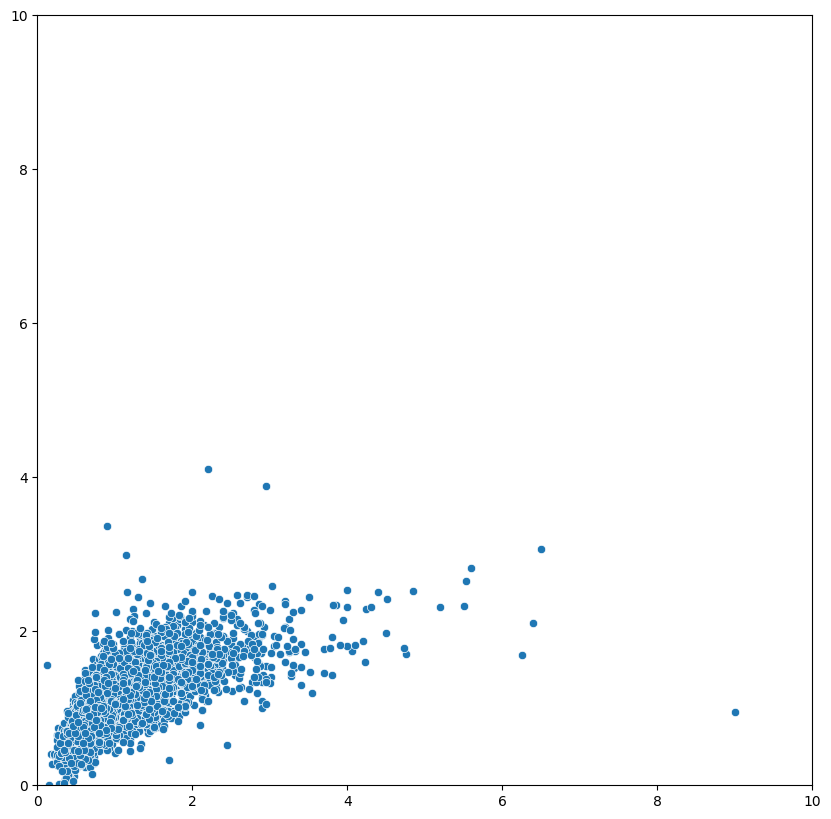

In [25]:
# visualizando o grafico
plt.figure(figsize=(10, 10))
sns.scatterplot(x=Y_teste.values/1000000, y=y_regressao2/1000000)
plt.ylim(0, 10)
plt.xlim(0, 10)
plt.show()

Árvore de decisão

In [26]:
from sklearn.tree import DecisionTreeRegressor

In [27]:
modelo3 = DecisionTreeRegressor()
modelo3.fit(X_treino, Y_treino)

DecisionTreeRegressor()

In [28]:
y_arvore = modelo3.predict(X_teste)

In [29]:
# Avaliando o erro
erro_quadratico_arvore = mean_squared_error(Y_teste, y_arvore)
print(erro_quadratico_arvore)

176331760775.61484


Resumo dos resultados por modelo

In [30]:
print('Regressão Linear:')
print('Erro quadrático:', erro_quadratico_regressao)
print('----------------------------------')
print('Regressão Linear: novas features')
print('Erro quadrático:', erro_quadratico_regressao2)
print('----------------------------------')
print('Árvore de Decisão: ')
print('Erro quadrático:', erro_quadratico_arvore)
print('----------------------------------')

Regressão Linear:
Erro quadrático: 314570712917.19025
----------------------------------
Regressão Linear: novas features
Erro quadrático: 233580498869.2424
----------------------------------
Árvore de Decisão: 
Erro quadrático: 176331760775.61484
----------------------------------
